<a href="https://colab.research.google.com/github/jmjamb81/Minimal/blob/main/chapter_2_bear_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!curl -s https://course19.fast.ai/setup/colab | bash

Updating fastai...
Done.


In [1]:
from fastai.vision.all import *

In [2]:
bear_types = 'grizzly', 'black', 'teddy'
path = Path('bears')

In [ ]:
%pip install fastai fastbook

In [4]:
import fastbook

In [5]:
from fastbook import *

In [22]:
from fastai.vision.widgets import *

In [6]:
if not path.exists():
    path.mkdir()
    for o in bear_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_ddg(f'{o} bear')
        download_images(dest, urls=results)

In [8]:
fns = get_image_files(path)
fns

(#576) [Path('bears/black/d560e9a7-9657-46b0-bef2-c2535c34a1da.jpg'),Path('bears/black/238ce178-1984-41af-8382-b528da7ceef6.jpg'),Path('bears/black/35ac3141-d0b3-4bf8-82c6-6ac09e1c5baa.jpg'),Path('bears/black/1a656a6a-2e72-4921-b38e-1ed9a3a12317.jpg'),Path('bears/black/5fb97577-9f77-4e2c-ad2e-f11598ec391a.jpg'),Path('bears/black/ceab8d05-b146-4a55-acb3-d65027c86113.jpg'),Path('bears/black/8e5443c0-b755-40f3-b164-8e5c6a5dbfa5.jpg'),Path('bears/black/9d5cf9f0-e61e-42e2-b036-7da7f4b9edab.jpg'),Path('bears/black/c4cad34a-1817-4525-87f6-1dd45b2c8f69.jpg'),Path('bears/black/b1aab4bd-5838-4b36-b081-d0509bbba491.jpg')...]

In [9]:
failed = verify_images(fns)
failed

(#14) [Path('bears/black/c72687d9-26fa-485f-aba4-80be218111b6.jpg'),Path('bears/black/08a6db72-9b7a-42dd-8b20-6fed675d4e73.jpg'),Path('bears/grizzly/9b5c8225-f2c8-4b42-b26a-a965c3eb5a99.jpg'),Path('bears/grizzly/f9aabd50-737e-42be-b1ac-36714f44c867.jpg'),Path('bears/grizzly/9eb90705-ec33-46f9-ab32-41f8b69a4fe7.jpg'),Path('bears/teddy/4605920c-8d38-4865-b403-591fb76da54d.jpg'),Path('bears/teddy/f3a99e61-41d9-4a90-adea-6239138e65b7.jpg'),Path('bears/teddy/a687577c-ef4a-4cd6-8550-c41507c045f0.jpg'),Path('bears/teddy/a3725077-2000-47a1-baf3-e18538afa98a.jpg'),Path('bears/teddy/666fe659-9db0-4922-b8d3-42a2330a8ead.jpg')...]

In [10]:
failed.map(Path.unlink)

(#14) [None,None,None,None,None,None,None,None,None,None...]

In [11]:
bears = DataBlock(
    # (x-independent(Used to make predictions),y-dependent(target))
    # Here our independent variable is images and our dependent variable is catagories
    blocks = (ImageBlock, CategoryBlock),
    # In this example our items will be file paths.
    # we have to tell fastai how to get a list of all those files.
    # get_image_files takes a path and returns a list of images in the path
    get_items=get_image_files,
    # splits our training and validation sets randomly.
    # sets a seed to have the same random split if run again
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    # We tell fastai what function to call to create labels in our dataset
    # parent_label gets the name of the folder a file is in.
    get_y=parent_label,
    # Our downloaded images are all different sizes. We need them to be the same size
    # item_tfms runs a transform on each item, this one specifically resizes images
    item_tfms=Resize(128))

In [12]:
dls = bears.dataloaders(path)

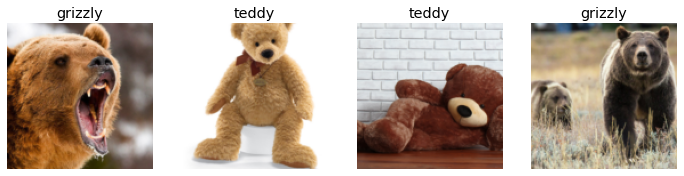

In [13]:
dls.valid.show_batch(max_n=4, nrows=1)

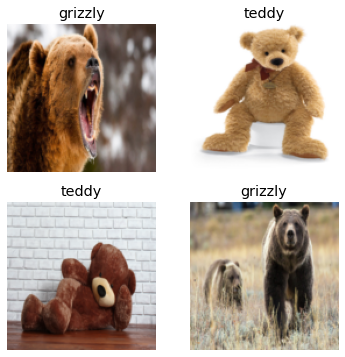

In [14]:
# we can resize the images so our model can process them. 
bears = bears.new(item_tfms= Resize(128, ResizeMethod.Squish))
# Squishes our image to a set size, in the above example, 128px.
dls = bears.dataloaders(path)
# We set the dataloaders path to the bears variable again since we squished th images
dls.valid.show_batch(max_n=4, nrows=2)

In [15]:
bears = bears.new(
    item_tfms = RandomResizedCrop(224, min_scale = 0.5),
    batch_tfms = aug_transforms())
dls = bears.dataloaders(path)

In [17]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.802917,0.062573,0.035714,00:29


epoch,train_loss,valid_loss,error_rate,time
0,0.100650,0.100366,0.035714,00:32
1,0.074501,0.132885,0.035714,00:29
2,0.060131,0.127510,0.044643,00:29
3,0.057300,0.116896,0.044643,00:28


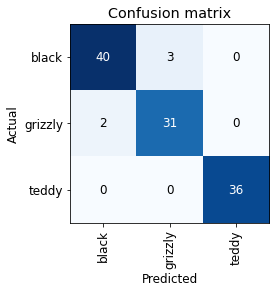

In [18]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

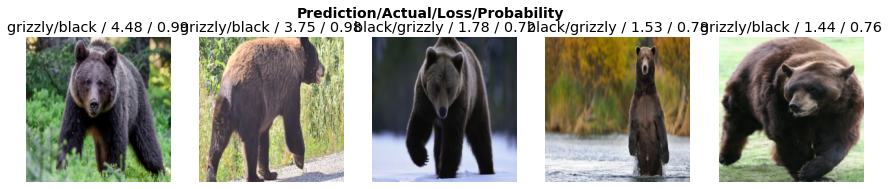

In [19]:
interp.plot_top_losses(5, nrows=1)

In [23]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [26]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [28]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [29]:
learn.export()

In [30]:
path = Path()
path.ls(file_exts=".pkl")

(#1) [Path('export.pkl')]

In [31]:
learn_inf = load_learner(path/"export.pkl")

In [33]:
learn_inf.predict('/content/bears/black/00f194a5-abef-46f5-8b82-72180d362523.jpg')

('black', TensorBase(0), TensorBase([1.0000e+00, 4.1385e-08, 3.0488e-08]))

In [34]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [35]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [36]:
img = PILImage.create(btn_upload.data[-1])

In [37]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128, 128))
out_pl

Output()

In [38]:
pred, pred_idx,probs = learn_inf.predict(img)

In [39]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: teddy; Probability: 0.9991')

In [40]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [41]:
def on_click_classify(change):
  img = PILImage.create(btn_upload.data[-1])
  out_pl.clear_output()
  with out_pl: display(img.to_thumb(128,128))
  pred,pred_idx,probs = learn_inf.predict(img)
  lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [42]:
btn_upload = widgets.FileUpload()

In [43]:
VBox([widgets.Label('Select your bear!'),
      btn_upload, btn_run, out_pl, lbl_pred])

In [44]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.5 MB 27.9 MB/s 
     |████████████████████████████████| 346 kB 67.6 MB/s 
     |████████████████████████████████| 106 kB 55.9 MB/s 
     |████████████████████████████████| 71 kB 251 kB/s 
     |████████████████████████████████| 273 kB 68.9 MB/s 
     |████████████████████████████████| 54 kB 3.1 MB/s 
     |████████████████████████████████| 55 kB 4.3 MB/s 
     |████████████████████████████████| 80 kB 3.7 MB/s 
     |████████████████████████████████| 423 kB 70.0 MB/s 
     |████████████████████████████████| 60 kB 8.5 MB/s 
     |████████████████████████████████| 133 kB 67.3 MB/s 
     |████████████████████████████████| 107 kB 73.7 MB/s 
     |████████████████████████████████| 86 kB 6.2 MB/s 
  Attempting uninstall: traitlets
    Found existing installation: traitlets 5.1.1
    Uninstalling traitlets-5.1.1:
      Successfully uninstalled traitlets-5

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila 0.4.0 OK
